


# Custom Training with YOLOv5

The goal of this google colab is to assemble a dataset and train a custom YOLOv5 model to recognize the face of one of our members. To do so we will take the following steps:

* Gather a dataset of images and label our dataset using roboflow
* Export our dataset to YOLOv5
* Train two YOLOv5 models, firt one to recognize the specific member of our team and second one to recognize a mask in order to make the detection part more robust
* Evaluate our YOLOv5 model's performance
* Run test inference to view our models at work
* Make it work on a webcam

![](https://uploads-ssl.webflow.com/5f6bc60e665f54545a1e52a5/615627e5824c9c6195abfda9_computer-vision-cycle.png)

# Sources : 

https://colab.research.google.com/github/roboflow-ai/yolov5-custom-training-tutorial/blob/main/yolov5-custom-training.ipynb

https://www.youtube.com/watch?v=YjWh7QvVH60&ab_channel=TheAIGuy

# Short description : 

To do so, we use yolov5 algorithm to detect the face of one of our members and the mask. we use roboflow to create the dataset and label the images. 

# Step 1: Install Requirements

In [ ]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo for yolov5
%cd yolov5                                        # go in yolov5 folder 
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

# Check if we have a GPU
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

fatal: destination path 'yolov5' already exists and is not an empty directory.
[Errno 2] No such file or directory: 'yolov5 # go in yolov5 folder'
/content
ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'requirements.txt'
Setup complete. Using torch 1.11.0+cu113 (CPU)


# Step 2: Assemble Our Dataset

In order to train our custom model, we need to assemble a dataset of representative images with bounding box annotations around the objects that we want to detect. And we need our dataset to be in YOLOv5 format.

In Roboflow, we decided to : 
* Upload raw images and annotate them in Roboflow with [Roboflow Annotate](https://docs.roboflow.com/annotate).

# Annotate

![](https://roboflow-darknet.s3.us-east-2.amazonaws.com/roboflow-annotate.gif)




In [ ]:
#Get the API key to load our dataset
from roboflow import Roboflow  
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [ ]:
# set up environment for dataset 
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [ ]:
# LOAD OUR DATASET USING ROBOFLOW :

#after following the link above, recieve python code with these fields filled in

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="Yb0PebfD0OkaLsYC1adB")
project = rf.workspace("nada-guerraoui").project("face-asp8m")
dataset = project.version(13).download("yolov5") #load dataset on format yolov5

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/face-10 in yolov5pytorch:: 100%|██████████| 2112/2112 [00:01<00:00, 1331.19it/s]


# Roboflow :  
It can also use a dataset already labeled such as for mask detection  : 
https://public.roboflow.com/object-detection/mask-wearing, 
fork this dataset in your account and use the same method as above 

In [ ]:
'''from roboflow import Roboflow
rf = Roboflow(api_key="ev7JQQTBUywaTDpamwzM")
project = rf.workspace("thomas-peeters").project("mask-wearing-4kk61")
dataset = project.version(1).download("yolov5")'''

'from roboflow import Roboflow\nrf = Roboflow(api_key="ev7JQQTBUywaTDpamwzM")\nproject = rf.workspace("thomas-peeters").project("mask-wearing-4kk61")\ndataset = project.version(1).download("yolov5")'

# Step 3: Train Our Custom YOLOv5 model

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training   

In [ ]:
# Train our model choosing the input size of the image (416*416 pixel in this case), the batch size and the number of epoch
# using the python file "train.py" given in the yolov5 folder
%cd yolov5
!python train.py --img 640 --batch 16 --epochs 150 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

/content/yolov5
train: weights=yolov5s.pt, cfg=, data=/content/datasets/face-10/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-163-gb53917d torch 1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_

In [ ]:
#export your model's weights for future use : 

from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

If you are new to these metrics, the one you want to focus on is `mAP_0.5` - learn more about mean average precision [here](https://blog.roboflow.com/mean-average-precision/).

# The different metrics : 



* precision : TP / (Total positive results)
* recall  :  TP / (Ground Truth boxes)

* maP : area under the precision recall curve. 

Values can be computed for different IoU treshold


In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"

# Get all the metrics : 
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/face-10/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-163-gb53917d torch 1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 213 layers, 7012822 parameters, 0 gradients
image 1/43 /content/datasets/face-10/test/images/0008_6A_jpg.rf.af48d9c8eb40a0e965c6d0b3179268ed.jpg: 640x640 Done. (0.013s)
image 2/43 /content/datasets/face-10/test/images/6e7c889e-90a0-4e78-b1a5-9be46124d8d7_JPG.rf.a956e768802bfaee3b55e8850eb6ec12.jpg: 640x640 Done. (0.013s)
image 3/43 /content/datasets/face-10/test/images/9f678c1f-50ce-4529-a919-6a0b46cbb973_jpg.r

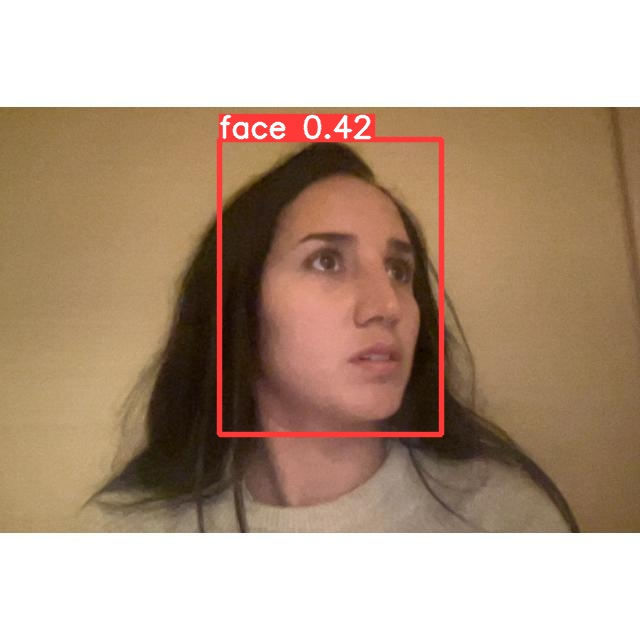

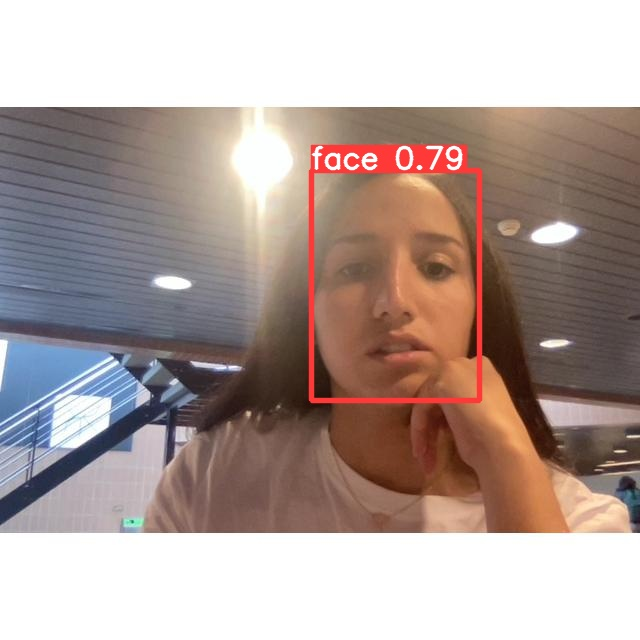

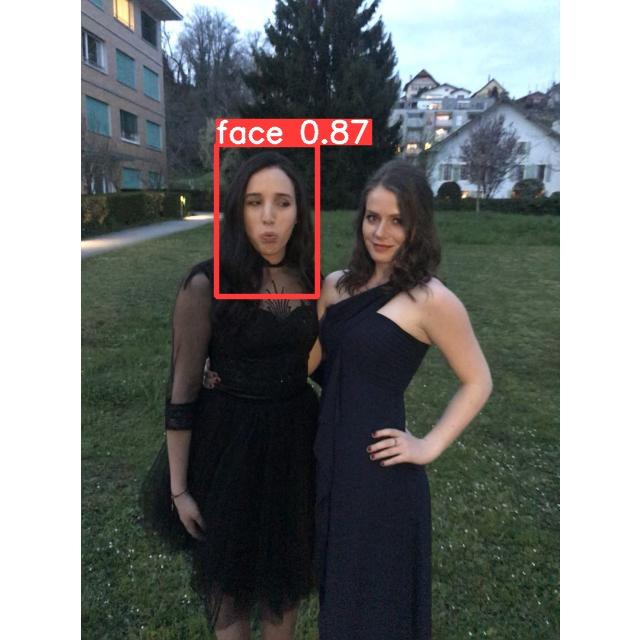

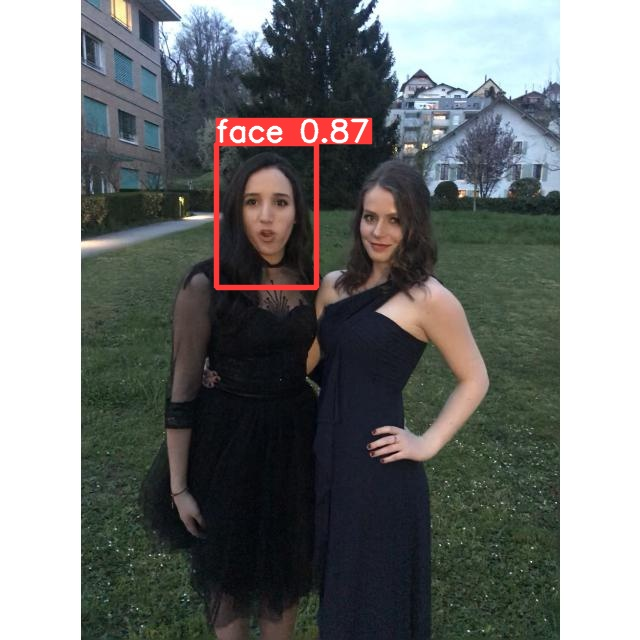

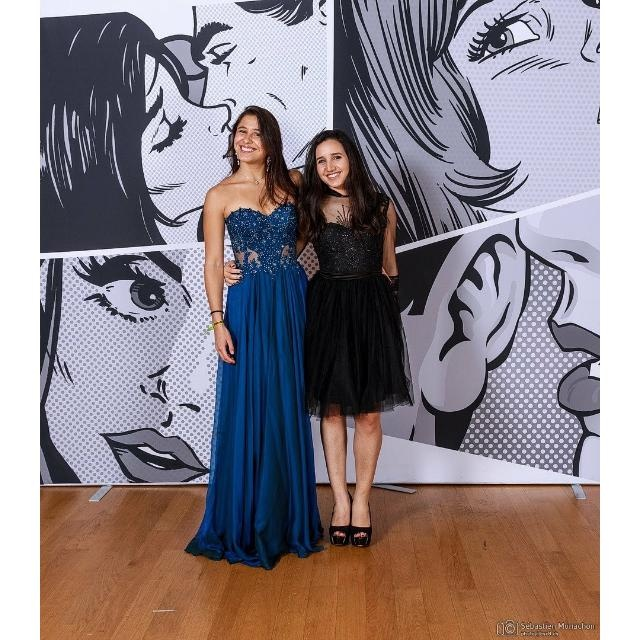

...

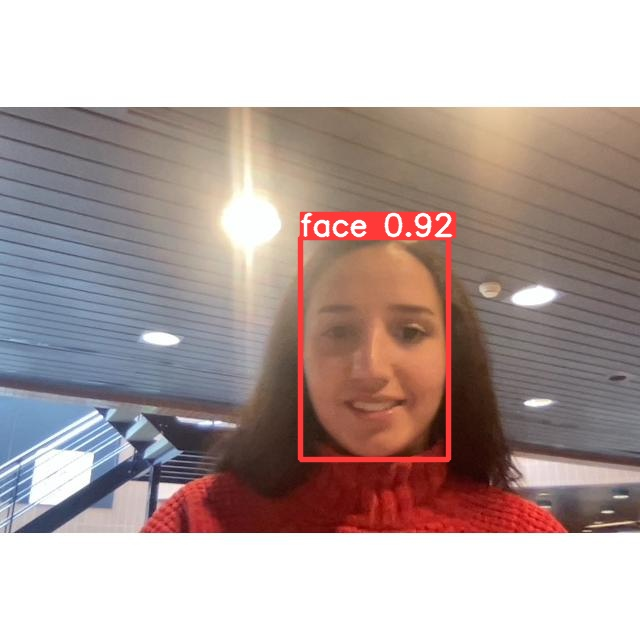

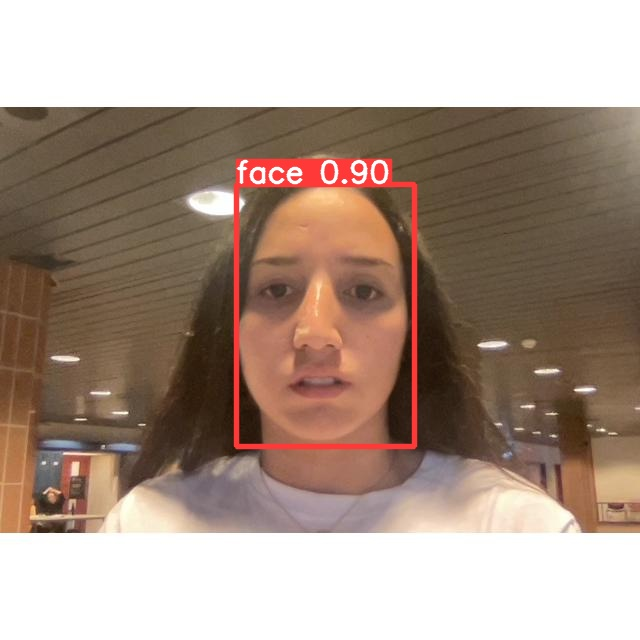

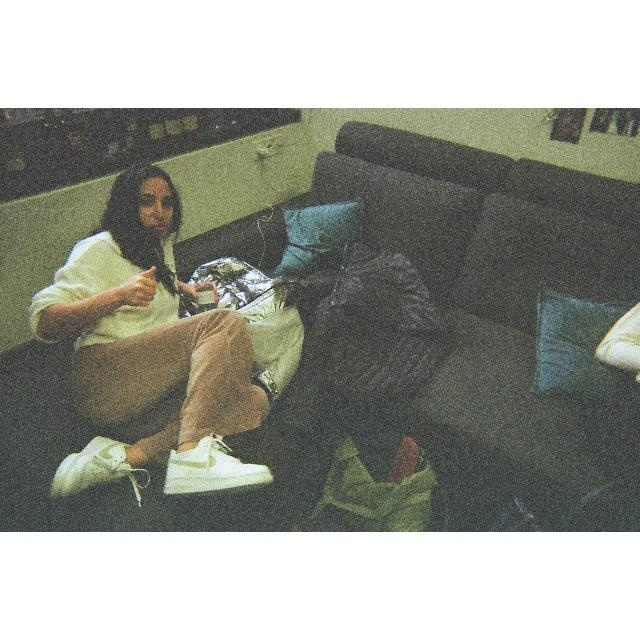

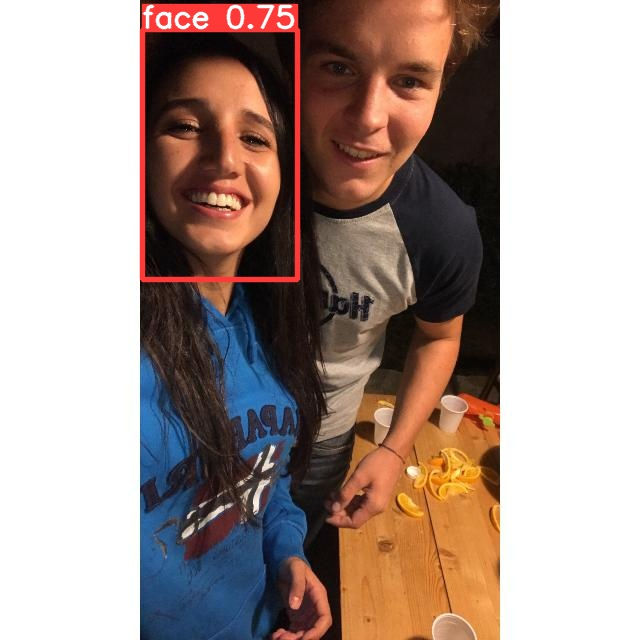

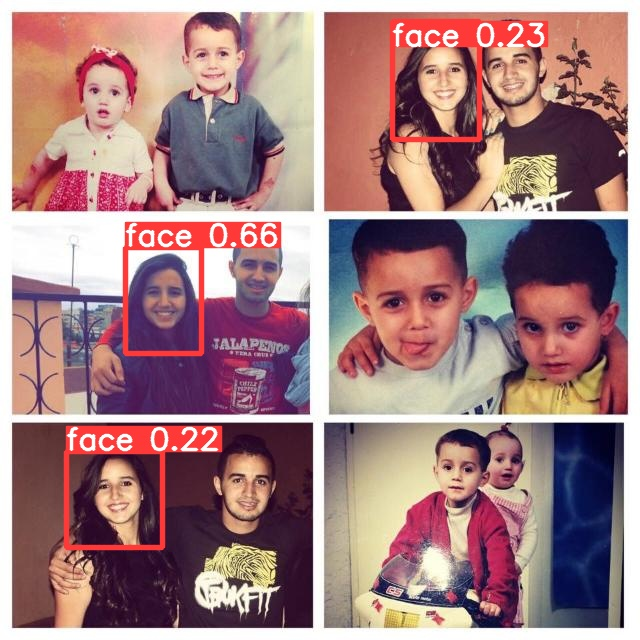

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# RUN IT ON THE WEBCAM  : 

Follow method from https://www.youtube.com/watch?v=YjWh7QvVH60&ab_channel=TheAIGuy to make the yolov5 algorithm work on a webcam in google colab

In [ ]:
# Create our yolov5 model and load our best weight (weight that we trained above or weight that we uploaded)

import torch
model=torch.hub.load('ultralytics/yolov5', 'custom',  path='best_27_04_final.pt')   #path='runs/train/exp/weights/best.pt' ) 
model_mask =torch.hub.load('ultralytics/yolov5', 'custom', path='best_mask_28_04.pt')


Downloading: "https://github.com/ultralytics/yolov5/archive/master.zip" to /root/.cache/torch/hub/master.zip
requirements: PyYAML>=5.3.1 not found and is required by YOLOv5, attempting auto-update...
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13

requirements: 1 package updated per /root/.cache/torch/hub/ultralytics_yolov5_master/requirements.txt
requirements: ⚠️ Restart runtime or rerun command for updates to take effect

YOLOv5 🚀 2022-4-28 torch 1.11.0+cu113 CPU

Fusing layers... 
Model summary: 213 layers, 7012822 parameters, 0 gradients
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
requirements: PyYAML>=5.3.1 not found and is required by YOLOv5, attempting auto-update...

requirements: 1 package updated per /root/.cache/torch/hub/ultralytics_yolov5_master/requirements.txt
requirements: ⚠️ Restart runtime or rerun command for updates to 

In [ ]:
#set model confidence to have trade off between precision and recal
model.conf = 0.3

In [ ]:
# import dependencies
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from google.colab.patches import cv2_imshow
from base64 import b64decode, b64encode
import cv2
import numpy as np
import PIL
import io
import html
import time
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
# function to convert the JavaScript object into an OpenCV image
def js_to_image(js_reply):
  """
  Params:
          js_reply: JavaScript object containing image from webcam
  Returns:
          img: OpenCV BGR image
  """
  # decode base64 image
  image_bytes = b64decode(js_reply.split(',')[1])
  # convert bytes to numpy array
  jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)
  # decode numpy array into OpenCV BGR image
  img = cv2.imdecode(jpg_as_np, flags=1)

  return img

# function to convert OpenCV Rectangle bounding box image into base64 byte string to be overlayed on video stream
def bbox_to_bytes(bbox_array):
  """
  Params:
          bbox_array: Numpy array (pixels) containing rectangle to overlay on video stream.
  Returns:
        bytes: Base64 image byte string
  """
  # convert array into PIL image
  bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')
  iobuf = io.BytesIO()
  # format bbox into png for return
  bbox_PIL.save(iobuf, format='png')
  # format return string
  bbox_bytes = 'data:image/png;base64,{}'.format((str(b64encode(iobuf.getvalue()), 'utf-8')))

  return bbox_bytes

In [ ]:
def take_photo(filename='photo.jpg', quality=0.8):

  # JAVA SCRIPt CODE given by https://www.youtube.com/watch?v=YjWh7QvVH60&ab_channel=TheAIGuy to take a photo with a webcam on google colab 
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)

  # get photo data
  data = eval_js('takePhoto({})'.format(quality))
  # get OpenCV format image
  img = js_to_image(data) 
  img_RGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) #to improve the detection 
  
  print(img.shape)

  results = model(img_RGB)  # run our model on the image 
  resultM = model_mask(img_RGB) #run the model for the mask
   
  detect=results.pandas().xyxy[0] # Get the bounding box, the confidence and the class
  detectM = resultM.pandas().xyxy[0] # Get the bounding box, the confidence and the class
  detectM = detectM [(detectM['class']== 0)] #keep only mask class 
  print(results.pandas().xyxy[0])
  print(resultM.pandas().xyxy[0])

  # Since we only want to detect the face of one of our members, if our algorithm detect multiple faces we will only plot the bounding box for the face who has the most confidence 
  if not detect.empty:
    #for face
    cv2.rectangle(img, (int(detect.iloc[0]['xmin']), int(detect.iloc[0]['ymin'])), (int(detect.iloc[0]['xmax']), int(detect.iloc[0]['ymax'])), (255,0,0), 2)
    cv2.putText(img, "{} [{:.2f}]".format(detect.iloc[0]['name'], float(detect.iloc[0]['confidence'])),
                        (int(detect.iloc[0]['xmin']), int(detect.iloc[0]['ymin']) - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5,
                        (255,0,0), 2)
  if not detectM.empty:
    #for mask
    cv2.rectangle(img, (int(detectM.iloc[0]['xmin']), int(detectM.iloc[0]['ymin'])), (int(detectM.iloc[0]['xmax']), int(detectM.iloc[0]['ymax'])), (255,0,0), 2)
    cv2.putText(img, "{} [{:.2f}]".format(detectM.iloc[0]['name'], float(detectM.iloc[0]['confidence'])),
                        (int(detectM.iloc[0]['xmin']), int(detectM.iloc[0]['ymin']) - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5,
                        (255,0,0), 2)
  

  # save image
  cv2.imwrite(filename, img)

  return filename

<IPython.core.display.Javascript object>

(480, 640, 3)
         xmin       ymin        xmax        ymax  confidence  class  name
0  270.367126  45.737549  411.785645  259.120026    0.962801      0  face
         xmin       ymin        xmax        ymax  confidence  class     name
0  255.065887  42.352837  422.492340  257.245117    0.957214      1  no-mask
1    0.202045   0.011848   86.398193   94.937424    0.897620      1  no-mask
Saved to photo.jpg


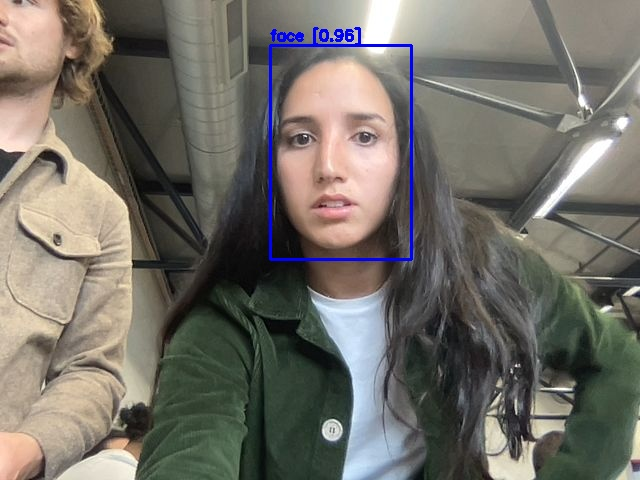

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

In [ ]:
# JavaScript to properly create our live video stream using our webcam as input
def video_stream():
  js = Javascript('''
    var video;
    var div = null;
    var stream;
    var captureCanvas;
    var imgElement;
    var labelElement;
    
    var pendingResolve = null;
    var shutdown = false;
    
    function removeDom() {
       stream.getVideoTracks()[0].stop();
       video.remove();
       div.remove();
       video = null;
       div = null;
       stream = null;
       imgElement = null;
       captureCanvas = null;
       labelElement = null;
    }
    
    function onAnimationFrame() {
      if (!shutdown) {
        window.requestAnimationFrame(onAnimationFrame);
      }
      if (pendingResolve) {
        var result = "";
        if (!shutdown) {
          captureCanvas.getContext('2d').drawImage(video, 0, 0, 640, 480);
          result = captureCanvas.toDataURL('image/jpeg', 0.8)
        }
        var lp = pendingResolve;
        pendingResolve = null;
        lp(result);
      }
    }
    
    async function createDom() {
      if (div !== null) {
        return stream;
      }

      div = document.createElement('div');
      div.style.border = '2px solid black';
      div.style.padding = '3px';
      div.style.width = '100%';
      div.style.maxWidth = '600px';
      document.body.appendChild(div);
      
      const modelOut = document.createElement('div');
      modelOut.innerHTML = "<span>Status:</span>";
      labelElement = document.createElement('span');
      labelElement.innerText = 'No data';
      labelElement.style.fontWeight = 'bold';
      modelOut.appendChild(labelElement);
      div.appendChild(modelOut);
           
      video = document.createElement('video');
      video.style.display = 'block';
      video.width = div.clientWidth - 6;
      video.setAttribute('playsinline', '');
      video.onclick = () => { shutdown = true; };
      stream = await navigator.mediaDevices.getUserMedia(
          {video: { facingMode: "environment"}});
      div.appendChild(video);

      imgElement = document.createElement('img');
      imgElement.style.position = 'absolute';
      imgElement.style.zIndex = 1;
      imgElement.onclick = () => { shutdown = true; };
      div.appendChild(imgElement);
      
      const instruction = document.createElement('div');
      instruction.innerHTML = 
          '<span style="color: red; font-weight: bold;">' +
          'When finished, click here or on the video to stop this demo</span>';
      div.appendChild(instruction);
      instruction.onclick = () => { shutdown = true; };
      
      video.srcObject = stream;
      await video.play();

      captureCanvas = document.createElement('canvas');
      captureCanvas.width = 640; //video.videoWidth;
      captureCanvas.height = 480; //video.videoHeight;
      window.requestAnimationFrame(onAnimationFrame);
      
      return stream;
    }
    async function stream_frame(label, imgData) {
      if (shutdown) {
        removeDom();
        shutdown = false;
        return '';
      }

      var preCreate = Date.now();
      stream = await createDom();
      
      var preShow = Date.now();
      if (label != "") {
        labelElement.innerHTML = label;
      }
            
      if (imgData != "") {
        var videoRect = video.getClientRects()[0];
        imgElement.style.top = videoRect.top + "px";
        imgElement.style.left = videoRect.left + "px";
        imgElement.style.width = videoRect.width + "px";
        imgElement.style.height = videoRect.height + "px";
        imgElement.src = imgData;
      }
      
      var preCapture = Date.now();
      var result = await new Promise(function(resolve, reject) {
        pendingResolve = resolve;
      });
      shutdown = false;
      
      return {'create': preShow - preCreate, 
              'show': preCapture - preShow, 
              'capture': Date.now() - preCapture,
              'img': result};
    }
    ''')

  display(js)
  
def video_frame(label, bbox):
  data = eval_js('stream_frame("{}", "{}")'.format(label, bbox)) # eval_js use to run a javascript code in python 
  return data

**Detection part** 

Here we checked for Nada's face (the team member chosen as person of interest) and if it's not detected after 5 frames, we start looking for the person wearing mask who will be the person of interest instead.


In [ ]:
# start streaming video from webcam
video_stream()
# label for video
label_html = 'Capturing...'
# initialze bounding box to empty
bbox = ''
count = 0 
while True:
    js_reply = video_frame(label_html, bbox)
    if not js_reply:
        break

    # convert JS response to OpenCV Image
    img = js_to_image(js_reply["img"])
    img_RGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    results = model(img_RGB)  # inference for face
   

    
    # create transparent overlay for bounding box
    bbox_array = np.zeros([480,640,4], dtype=np.uint8) # RGBA (4 channels) colour image
                                                       # RGBA is a type of CSS color value that allows us to set a color and also its opacity/transparency
 
    detect = results.pandas().xyxy[0]

    count += 1
    if not detect.empty:
      bbox_array = cv2.rectangle(bbox_array,(int(detect.iloc[0]['xmin']),int(detect.iloc[0]['ymin'])),(int(detect.iloc[0]['xmax']),int(detect.iloc[0]['ymax'])),(255,0,0),2)
      bbox_array = cv2.putText(bbox_array, "{} [{:.2f}]".format(detect.iloc[0]['name'], float(detect.iloc[0]['confidence'])),
                        (int(detect.iloc[0]['xmin']), int(detect.iloc[0]['ymin']) - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5,
                        (255,0,0), 2)
      count=0
    
    #Looking for mask after 5 frames 
    if count >5:

      resultM = model_mask(img_RGB) # inference for mask
      detectM = resultM.pandas().xyxy[0] # Get the bounding box, the confidence and the class
      detectM = detectM [(detectM['class']== 0)]

      if not detectM.empty:
        bbox_array = cv2.rectangle(bbox_array,(int(detectM.iloc[0]['xmin']),int(detectM.iloc[0]['ymin'])),(int(detectM.iloc[0]['xmax']),int(detectM.iloc[0]['ymax'])),(0,0,255),2)
        bbox_array = cv2.putText(bbox_array, "{} [{:.2f}]".format(detectM.iloc[0]['name'], float(detectM.iloc[0]['confidence'])),
                          (int(detectM.iloc[0]['xmin']), int(detectM.iloc[0]['ymin']) - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5,
                          (0,0,255), 2)
      
    bbox_array[:,:,3] = (bbox_array.max(axis = 2) > 0 ).astype(int) * 255 # to make the bounding box visible (convert from [0 1] to [0 255])
    
    # convert overlay of bbox into bytes
    bbox_bytes = bbox_to_bytes(bbox_array) #get a transparent image with a box where the face is detected. It will be put as an overlay on the webcam image to show detection of the image

    # update bbox so next frame gets new overlay
    bbox = bbox_bytes


<IPython.core.display.Javascript object>

Lien utile : https://www.section.io/engineering-education/object-detection-with-yolov5-and-pytorch/

https://www.youtube.com/watch?v=ebAykr9YZ30&ab_channel=TheAIGuy

Run yolov5 on windows directly (not in colab) 
https://www.youtube.com/watch?v=5h5UtLau3Vc


YOLO V4: https://colab.research.google.com/drive/1hQO4nOoD6RDxdbz3C1YSiifTsyZjZpYm?usp=sharing#scrollTo=afZcMjuiLEUi
